# Geospatial Analysis

## Contents:
### 01. Import libraries and data
### 02. Data wrangling
### 03. Conduct consistency checks
### 04. Plotting a choropleth

## 01. Import libraries and data

In [1]:
# Import libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import os
import folium
import json

In [2]:
# Prompt matplotlib visuals to appear in the notebook 

%matplotlib inline

In [3]:
# Import .geojson file for districts and counties

geo = r'C:\Users\lrutl\OneDrive\Desktop\Advanced Analytics & Dashboard Design\COVID19 School ReOpening and Students\02 Data\Washington_School_District_Boundaries.geojson'

In [4]:
f = open(r'C:\Users\lrutl\OneDrive\Desktop\Advanced Analytics & Dashboard Design\COVID19 School ReOpening and Students\02 Data\Washington_School_District_Boundaries.geojson')
  
# returns JSON object asa dictionary
data = json.load(f)
  
# Iterating through the json list
for i in data['features']:
    print(i)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'type': 'Feature', 'properties': {'OBJECTID': 247, 'OrganizationId': 100273, 'ESDCode': '34801', 'ESDNum': 113, 'ESDName': 'Capital Region ESD 113', 'LEACode': '34033', 'LEAName': 'Tumwater School District', 'ShortName': 'Tumwater', 'Label': None, 'PhysicalAddress': '621 LINWOOD AVE SW, TUMWATER, Washington, 98512-8499', 'MailingAddress': '621 LINWOOD AVE SW, TUMWATER, Washington, 98512-8499', 'AdministratorName': 'Sean  Dotson', 'AdministratorEmail': 'sean.dotson@tumwater.k12.wa.us', 'Phone': '(360)709-7000', 'Website': 'https://www.tumwater.k12.wa.us', 'County': 'Thurston', 'Counties': 'Thurston', 'CongressionalDistricts': '10', 'LegislativeDistricts': '20, 22, 35', 'Type': 'Public School District', 'TransportationRegion': 1, 'Shape__Area': 3215685147.22491, 'Shape__Length': 407083.816964688}, 'geometry': {'type': 'Polygon', 'coordinates': [[[-122.965880168001, 47.0253156820006], [-122.961926485001, 47.0253284620006], [-122.960601000001, 47.0253327180006], [-122.957846724001, 47.02

In [5]:
path = r'C:\Users\lrutl\OneDrive\Desktop\Advanced Analytics & Dashboard Design\COVID19 School ReOpening and Students'

In [6]:
# Import sf_rc_merged data

sf_rc = pd.read_csv(os.path.join(path,'02 Data','Prepared data','sf_rc_merged.csv'))

In [7]:
# Update max columns displayed to allow for all columns in df

pd.set_option("display.max_columns", 100)

In [8]:
sf_rc.head()

,Unnamed: 0,Week,DistrictName,Model_Elementary,Model_Middle,Model_High,GradeLevels_Remote_Phasein,StudentGroups_Remote_Phasein,Other_Remote_Phasein,Enrollment_Elementary,FullTimeALE_Elementary,OptOut_Elementary,TypicalInPerson_Elementary,Weekly_Elementary,Enrollment_Middle,FullTimeALE_Middle,OptOut_Middle,TypicalInPerson_Middle,Weekly_Middle,Enrollment_High,FullTimeALE_High,OptOut_High,TypicalInPerson_High,Weekly_High,Sum of Enrollment,Sum of OptOut,Rate of OptOut,OrganizationLevel,County,All Students,Female,Gender X,Male,American Indian/ Alaskan Native,Asian,Black/ African American,Hispanic/ Latino of any race(s),Native Hawaiian/ Other Pacific Islander,Two or More Races,White,English Language Learners,Highly Capable,Homeless,Low-Income,Migrant,Military Parent,Mobile,Section 504,Students with Disabilities,Non-English Language Learners,Non-Highly Capable,Non-Homeless,Non-Low Income,Non Migrant,Non Military Parent,Non Mobile,Non Section 504,Students without Disabilities,Percent Low-income,Percent Non-Low Income,Percent Homeless,Percent Non-Homeless
0,0,1/18/2021,Adna School District,Typical/Traditional In-Person,Partial In-Person for All Students,Partial In-Person for All Students,NaN,NaN,NaN,216,0,0,216,216,155,0,0,90,155,212,0,0,130,212,583,0,0,District,Lewis,591,293,1,297,5,4,6,45,0,10,521,0,25,8,173,0,8,19,8,64,591,566,583,418,591,583,572,583,527,0.29,0.71,0.01,0.99
1,1,1/25/2021,Adna School District,Typical/Traditional In-Person,Partial In-Person for All Students,Partial In-Person for All Students,NaN,NaN,NaN,216,0,0,216,216,155,0,0,90,155,212,0,0,130,212,583,0,0,District,Lewis,591,293,1,297,5,4,6,45,0,10,521,0,25,8,173,0,8,19,8,64,591,566,583,418,591,583,572,583,527,0.29,0.71,0.01,0.99
2,2,2/1/2021,Adna School District,Typical/Traditional In-Person,Partial In-Person for All Students,Partial In-Person for All Students,NaN,NaN,NaN,216,0,17,216,216,155,14,14,85,155,212,11,11,126,212,583,42,0.07,District,Lewis,591,293,1,297,5,4,6,45,0,10,521,0,25,8,173,0,8,19,8,64,591,566,583,418,591,583,572,583,527,0.29,0.71,0.01,0.99
3,3,2/22/2021,Adna School District,Partial In-Person for All Students,Partial In-Person for All Students,Partial In-Person for All Students,NaN,NaN,NaN,216,0,17,216,216,155,14,14,85,155,212,11,11,126,212,583,42,0.07,District,Lewis,591,293,1,297,5,4,6,45,0,10,521,0,25,8,173,0,8,19,8,64,591,566,583,418,591,583,572,583,527,0.29,0.71,0.01,0.99
4,4,3/1/2021,Adna School District,Partial In-Person for All Students,Partial In-Person for All Students,Partial In-Person for All Students,NaN,NaN,NaN,216,0,15,216,216,155,0,14,85,155,212,5,11,126,212,583,40,0.07,District,Lewis,591,293,1,297,5,4,6,45,0,10,521,0,25,8,173,0,8,19,8,64,591,566,583,418,591,583,572,583,527,0.29,0.71,0.01,0.99


In [9]:
sf_rc.shape

(5126, 62)

In [10]:
sf_rc.columns

Index(['Unnamed: 0', 'Week', 'DistrictName', 'Model_Elementary',
       'Model_Middle', 'Model_High', 'GradeLevels_Remote_Phasein',
       'StudentGroups_Remote_Phasein', 'Other_Remote_Phasein',
       'Enrollment_Elementary', 'FullTimeALE_Elementary', 'OptOut_Elementary',
       'TypicalInPerson_Elementary', 'Weekly_Elementary', 'Enrollment_Middle',
       'FullTimeALE_Middle', 'OptOut_Middle', 'TypicalInPerson_Middle',
       'Weekly_Middle', 'Enrollment_High', 'FullTimeALE_High', 'OptOut_High',
       'TypicalInPerson_High', 'Weekly_High', 'Sum of Enrollment',
       'Sum of OptOut', 'Rate of OptOut', 'OrganizationLevel', 'County',
       'All Students', 'Female', 'Gender X', 'Male',
       'American Indian/ Alaskan Native', 'Asian', 'Black/ African American',
       'Hispanic/ Latino of any race(s)',
       'Native Hawaiian/ Other Pacific Islander', 'Two or More Races', 'White',
       'English Language Learners', 'Highly Capable', 'Homeless', 'Low-Income',
       'Migrant', 'Milit

## 02. Data wrangling

In [11]:
# Select only the necessary columns and put them in a list called columns

columns1 = ["Week",
"DistrictName",
"Rate of OptOut"
]

In [12]:
# Create a subset

subset2 = sf_rc[columns1]

In [13]:
subset2.head()

,Week,DistrictName,Rate of OptOut
0,1/18/2021,Adna School District,0
1,1/25/2021,Adna School District,0
2,2/1/2021,Adna School District,0.07
3,2/22/2021,Adna School District,0.07
4,3/1/2021,Adna School District,0.07


In [14]:
# Filter subset to only use data for week of 3/1

subset2 = subset2[subset2['Week']=='3/1/2021']

In [15]:
subset2.head(10)

,Week,DistrictName,Rate of OptOut
4,3/1/2021,Adna School District,0.07
18,3/1/2021,Almira School District,0
37,3/1/2021,Arlington School District,0.04
56,3/1/2021,Asotin-Anatone School District,0.04
75,3/1/2021,Auburn School District,0.12
94,3/1/2021,Bainbridge Island School District,0.13
126,3/1/2021,Bellingham School District,0.09
145,3/1/2021,Benge School District,0.13
178,3/1/2021,Bickleton School District,0.03
197,3/1/2021,Blaine School District,0.25


In [16]:
subset2.columns

Index(['Week', 'DistrictName', 'Rate of OptOut'], dtype='object')

In [17]:
type(subset2)

pandas.core.frame.DataFrame

In [18]:
# Change DistrictName to LEAName to match GIS data

subset2.rename(columns = {'DistrictName' : 'LEAName'}, inplace = True)

In [19]:
subset2['LEAName'] = subset2['LEAName'].str.title()

In [20]:
# Drop Week column

March1_OptOutRate = subset2.drop(columns = ['Week'])

In [21]:
March1_OptOutRate.head()

,LEAName,Rate of OptOut
4,Adna School District,0.07
18,Almira School District,0
37,Arlington School District,0.04
56,Asotin-Anatone School District,0.04
75,Auburn School District,0.12


In [22]:
March1_OptOutRate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 278 entries, 4 to 5118
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   LEAName         278 non-null    object
 1   Rate of OptOut  278 non-null    object
dtypes: object(2)
memory usage: 6.5+ KB


## 03. Conduct consistency checks

In [23]:
# Check for missing values

March1_OptOutRate.isnull().sum()

LEAName           0
Rate of OptOut    0
dtype: int64

In [24]:
# Check for duplicates

dups = March1_OptOutRate.duplicated()

In [25]:
dups.shape

(278,)

<AxesSubplot:xlabel='Rate of OptOut', ylabel='Count'>

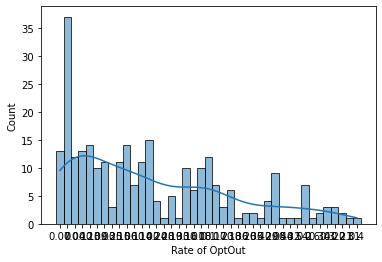

In [26]:
# Extreme values checks

sns.histplot(March1_OptOutRate['Rate of OptOut'], bins=20, kde = True) # shows extreme values for 'Homeless'

## 04. Plotting a choropleth

In [27]:
# Create a data frame with just the LEANames and the values we want plotted

data_to_plot = March1_OptOutRate[['LEAName','Rate of OptOut']]
data_to_plot.head()

,LEAName,Rate of OptOut
4,Adna School District,0.07
18,Almira School District,0
37,Arlington School District,0.04
56,Asotin-Anatone School District,0.04
75,Auburn School District,0.12


In [28]:
# Change "rate of optout" data type to float64

data_to_plot['Rate of OptOut'] = data_to_plot['Rate of OptOut'].astype('float64')

In [29]:
data_to_plot.head(20)

,LEAName,Rate of OptOut
4,Adna School District,0.07
18,Almira School District,0.00
37,Arlington School District,0.04
56,Asotin-Anatone School District,0.04
75,Auburn School District,0.12
94,Bainbridge Island School District,0.13
126,Bellingham School District,0.09
145,Benge School District,0.13
178,Bickleton School District,0.03
197,Blaine School District,0.25


In [56]:
# Setup a folium map at a high-level zoom
map = folium.Map(location = [100, 0], zoom_start = 1.5)

# Choropleth maps bind Pandas Data Frames and json geometries.This allows us to quickly visualize data combinations
folium.Choropleth(
    geo_data = geo, 
    data = data_to_plot,
    columns = ['LEAName','Rate of OptOut'],
    key_on = 'feature.properties.LEAName', # this part is very important - check your json file to see where the KEY is located
    fill_color = 'YlOrBr', fill_opacity=0.6, line_opacity=0.1,
    legend_name = "3/1/2020 Rate of OptOut").add_to(map)
folium.LayerControl().add_to(map)

map

In [44]:
map.save('plot_data.html')

In [51]:
data_to_plot.head(50)

,LEAName,Rate of OptOut
4,Adna School District,0.07
18,Almira School District,0.00
37,Arlington School District,0.04
56,Asotin-Anatone School District,0.04
75,Auburn School District,0.12
94,Bainbridge Island School District,0.13
126,Bellingham School District,0.09
145,Benge School District,0.13
178,Bickleton School District,0.03
197,Blaine School District,0.25


In [57]:
# Export "data_to_plot" as csv file

data_to_plot.to_csv(os.path.join(path,'02 Data','Prepared data','geospatial_analysis_subset.csv'))